In [41]:
import io
import requests
import tqdm
import yaml
from PIL import Image

In [3]:
with open("../config.yml", "r") as stream:
    try:
        configs = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

In [4]:
server_address = configs["server"]["ip_address"]
server_port = str(configs["server"]["port"])
generated_image_size = 350

In [55]:
def gen_img(text_prompt):
    # Generates a new image from text prompt
    url = 'http://' + server_address + ':' + server_port + \
    '/generate/' + text_prompt + '?size={}'.format(generated_image_size)
    response = requests.get(url)
    return Image.open(io.BytesIO(response.content))

In [42]:
def gen_multiple_imgs(text_prompt, num_imgs=3):
    imgs = []
    for _ in tqdm.tqdm(range(num_imgs)):
        imgs.append(gen_img(text_prompt))
    return imgs

In [43]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


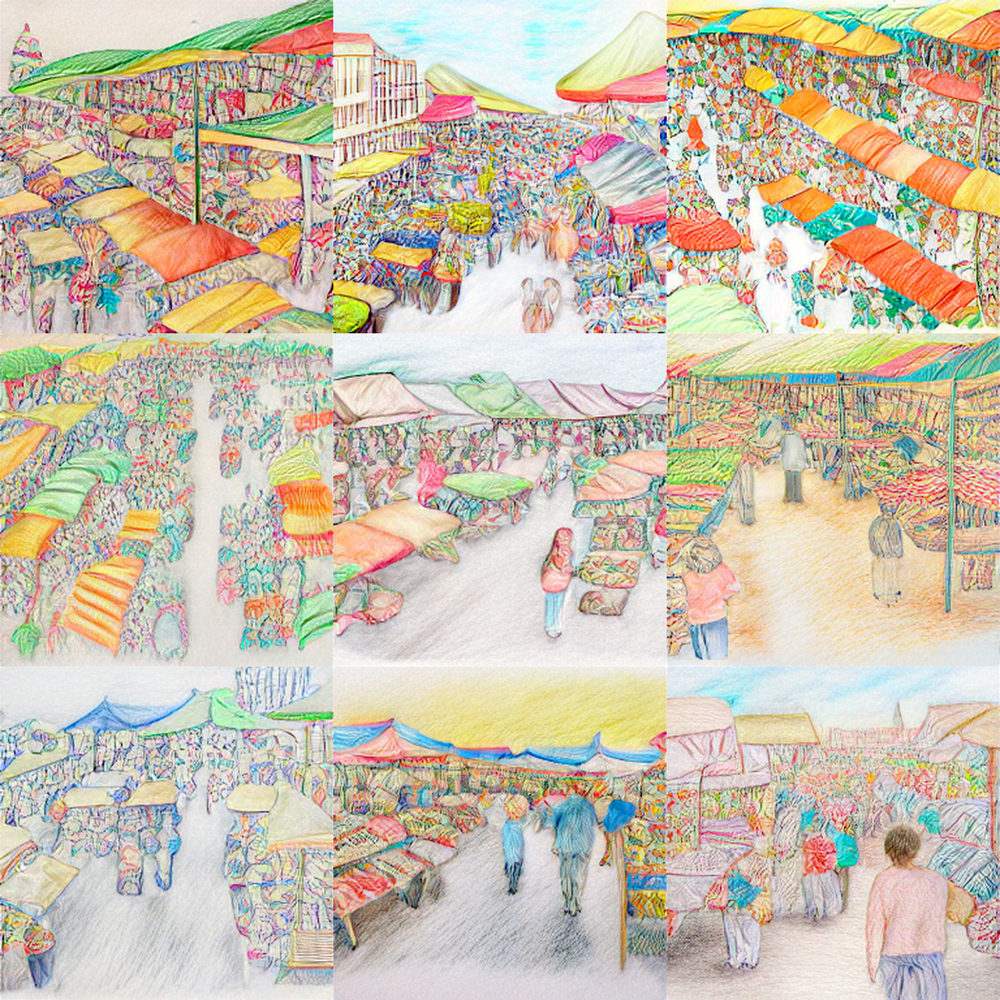

In [39]:
imgs = gen_multiple_imgs(
    "a high angle colored pencil drawing of a busy marketplace",
    num_imgs=9
    
)
image_grid(imgs, 3, 3)

100%|██████████| 9/9 [00:56<00:00,  6.33s/it]


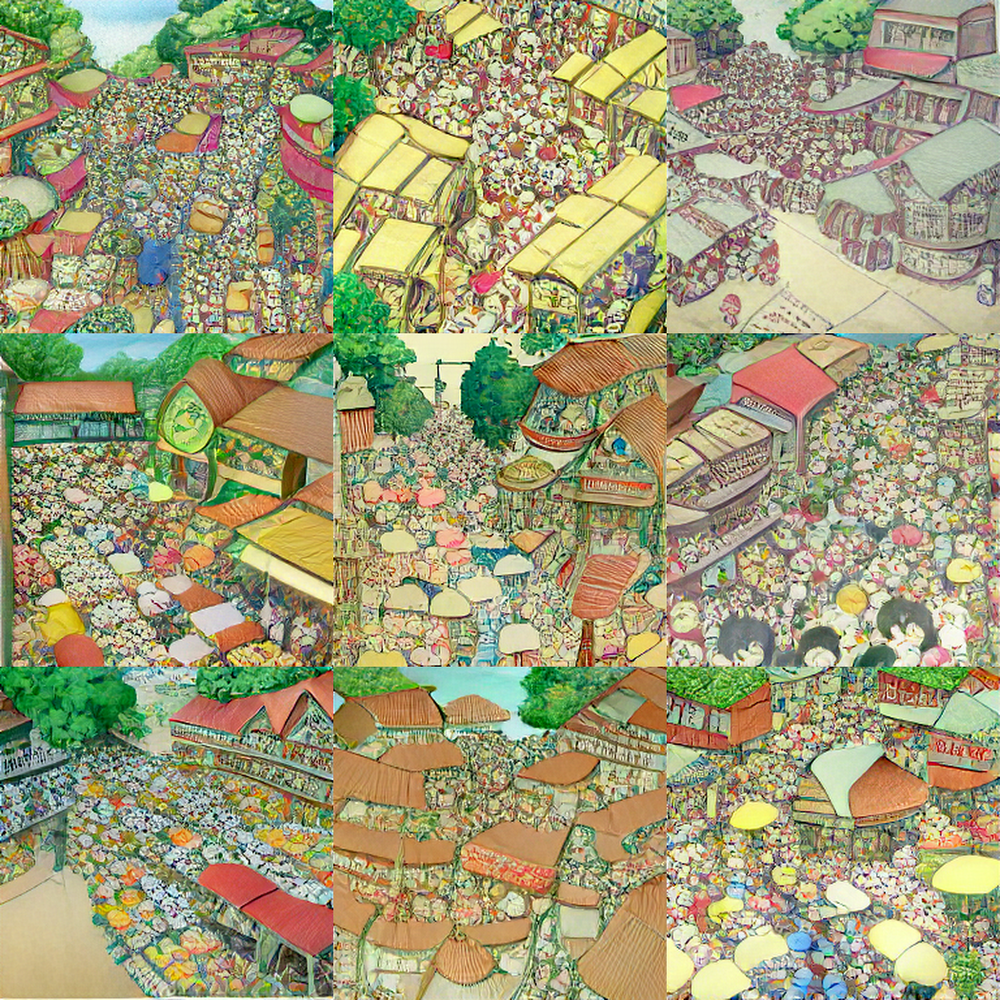

In [44]:
imgs = gen_multiple_imgs(
    "a high angle drawing of a busy marketplace in style of hayao miyazaki",
    num_imgs=9
    
)
image_grid(imgs, 3, 3)

100%|██████████| 16/16 [01:37<00:00,  6.07s/it]


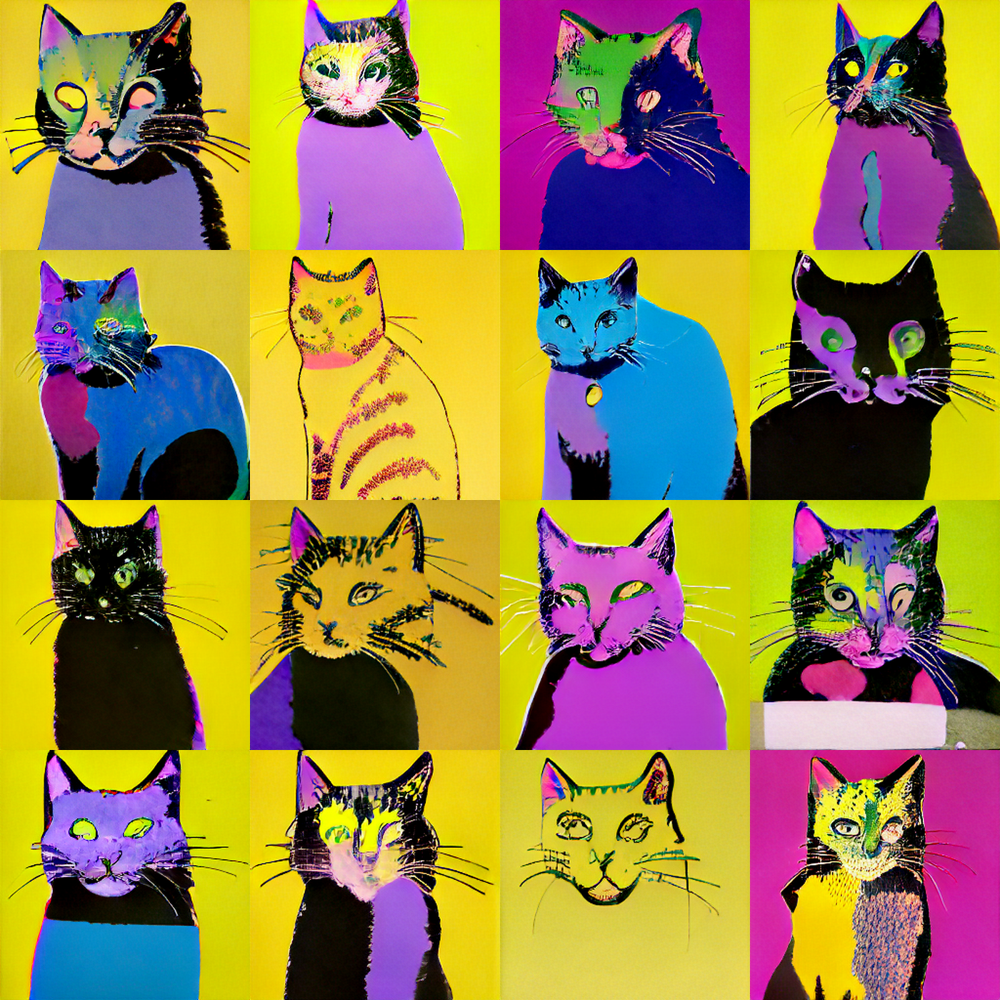

In [56]:
imgs = gen_multiple_imgs(
    "a drawing of a cat in style of andy warhol",
    num_imgs=16
    
)
image_grid(imgs, 4, 4)

100%|██████████| 4/4 [00:23<00:00,  5.91s/it]


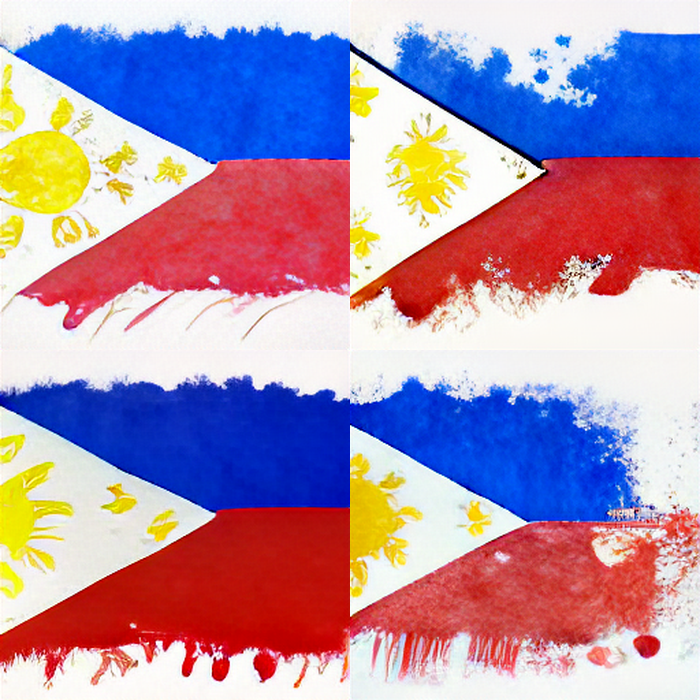

In [63]:
imgs = gen_multiple_imgs(
    "a water color painting of the flag of the Philippines",
    num_imgs=4
    
)
image_grid(imgs, 2, 2)